# Global Analysis

In [2]:
import xarray as xr
from matplotlib.pylab import *
import numpy as np
import pandas as pd
from geopy import distance
from mpl_toolkits.axes_grid1 import make_axes_locatable
from geographiclib.geodesic import Geodesic
import time

import warnings 
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [3]:
data = xr.open_dataset('All_basin.nc4')
data

<xarray.Dataset>
Dimensions:           (storm: 1636, time: 137)
Coordinates:
  * storm             (storm) int64 5630 5632 5633 5634 ... 7263 7264 7265 7266
  * time              (time) int64 0 1 2 3 4 5 6 ... 130 131 132 133 134 135 136
Data variables:
    latitud           (storm, time) float32 ...
    longitud          (storm, time) float32 ...
    presion           (storm, time) float32 ...
    cuenca            (storm, time) float32 ...
    distancia_tierra  (storm, time) float32 ...
    fechas            (storm, time) datetime64[ns] ...

# Velocidad de traslación - Pmin

Cálculo de distancia en m entre dos centros consecutivos del ciclón

In [42]:
distance.geodesic((-12.3,173.5) , (-12.4,172.9)).m 

66187.09955075983

Diferencias entre los dos instantes de tiempo de los centros consecutivos:

In [41]:
(pd.to_datetime(xr.open_dataset('All_cyclones/ciclon_all0.nc4').time.values[1]) - pd.to_datetime(xr.open_dataset('All_cyclones/ciclon_all0.nc4').time.values[0])).seconds

21600

Visualizamos en un histrograma los valores de velocidad de traslación en m/s

In [3]:
total_vel = []
for t in range(0,1636):
    storm = xr.open_dataset('All_cyclones/ciclon_all'+str(t)+'.nc4') #seleccionamos la storm que corresponde en cada bucle
    
    storm_vel = []
    for k in range(0,len(storm.time)): 
        if k == 0:
            storm_vel.append(np.nan)
        else: 
            diff_time = (pd.to_datetime(xr.open_dataset('All_cyclones/ciclon_all'+str(t)+'.nc4').time.values[k]) - pd.to_datetime(xr.open_dataset('All_cyclones/ciclon_all'+str(t)+'.nc4').time.values[k-1])).total_seconds()
            storm_vel.append((distance.geodesic((storm.latitude[k-1],storm.longitude[k-1]) , (storm.latitude[k],storm.longitude[k])).m)/diff_time)
    
    xr.DataArray(storm_vel).to_netcdf('All_cyclones/speed_ciclon_all'+str(t)+'.nc4')
    total_vel.append(np.array(storm_vel))
    print('speed cyclone '+str(t)+' computed')

speed cyclone 0 computed
speed cyclone 1 computed
speed cyclone 2 computed
speed cyclone 3 computed
speed cyclone 4 computed
speed cyclone 5 computed
speed cyclone 6 computed
speed cyclone 7 computed
speed cyclone 8 computed
speed cyclone 9 computed
speed cyclone 10 computed
speed cyclone 11 computed
speed cyclone 12 computed
speed cyclone 13 computed
speed cyclone 14 computed
speed cyclone 15 computed
speed cyclone 16 computed
speed cyclone 17 computed
speed cyclone 18 computed
speed cyclone 19 computed
speed cyclone 20 computed
speed cyclone 21 computed
speed cyclone 22 computed
speed cyclone 23 computed
speed cyclone 24 computed
speed cyclone 25 computed
speed cyclone 26 computed
speed cyclone 27 computed
speed cyclone 28 computed
speed cyclone 29 computed
speed cyclone 30 computed
speed cyclone 31 computed
speed cyclone 32 computed
speed cyclone 33 computed
speed cyclone 34 computed
speed cyclone 35 computed
speed cyclone 36 computed
speed cyclone 37 computed
speed cyclone 38 compu

speed cyclone 308 computed
speed cyclone 309 computed
speed cyclone 310 computed
speed cyclone 311 computed
speed cyclone 312 computed
speed cyclone 313 computed
speed cyclone 314 computed
speed cyclone 315 computed
speed cyclone 316 computed
speed cyclone 317 computed
speed cyclone 318 computed
speed cyclone 319 computed
speed cyclone 320 computed
speed cyclone 321 computed
speed cyclone 322 computed
speed cyclone 323 computed
speed cyclone 324 computed
speed cyclone 325 computed
speed cyclone 326 computed
speed cyclone 327 computed
speed cyclone 328 computed
speed cyclone 329 computed
speed cyclone 330 computed
speed cyclone 331 computed
speed cyclone 332 computed
speed cyclone 333 computed
speed cyclone 334 computed
speed cyclone 335 computed
speed cyclone 336 computed
speed cyclone 337 computed
speed cyclone 338 computed
speed cyclone 339 computed
speed cyclone 340 computed
speed cyclone 341 computed
speed cyclone 342 computed
speed cyclone 343 computed
speed cyclone 344 computed
s

speed cyclone 612 computed
speed cyclone 613 computed
speed cyclone 614 computed
speed cyclone 615 computed
speed cyclone 616 computed
speed cyclone 617 computed
speed cyclone 618 computed
speed cyclone 619 computed
speed cyclone 620 computed
speed cyclone 621 computed
speed cyclone 622 computed
speed cyclone 623 computed
speed cyclone 624 computed
speed cyclone 625 computed
speed cyclone 626 computed
speed cyclone 627 computed
speed cyclone 628 computed
speed cyclone 629 computed
speed cyclone 630 computed
speed cyclone 631 computed
speed cyclone 632 computed
speed cyclone 633 computed
speed cyclone 634 computed
speed cyclone 635 computed
speed cyclone 636 computed
speed cyclone 637 computed
speed cyclone 638 computed
speed cyclone 639 computed
speed cyclone 640 computed
speed cyclone 641 computed
speed cyclone 642 computed
speed cyclone 643 computed
speed cyclone 644 computed
speed cyclone 645 computed
speed cyclone 646 computed
speed cyclone 647 computed
speed cyclone 648 computed
s

speed cyclone 916 computed
speed cyclone 917 computed
speed cyclone 918 computed
speed cyclone 919 computed
speed cyclone 920 computed
speed cyclone 921 computed
speed cyclone 922 computed
speed cyclone 923 computed
speed cyclone 924 computed
speed cyclone 925 computed
speed cyclone 926 computed
speed cyclone 927 computed
speed cyclone 928 computed
speed cyclone 929 computed
speed cyclone 930 computed
speed cyclone 931 computed
speed cyclone 932 computed
speed cyclone 933 computed
speed cyclone 934 computed
speed cyclone 935 computed
speed cyclone 936 computed
speed cyclone 937 computed
speed cyclone 938 computed
speed cyclone 939 computed
speed cyclone 940 computed
speed cyclone 941 computed
speed cyclone 942 computed
speed cyclone 943 computed
speed cyclone 944 computed
speed cyclone 945 computed
speed cyclone 946 computed
speed cyclone 947 computed
speed cyclone 948 computed
speed cyclone 949 computed
speed cyclone 950 computed
speed cyclone 951 computed
speed cyclone 952 computed
s

speed cyclone 1212 computed
speed cyclone 1213 computed
speed cyclone 1214 computed
speed cyclone 1215 computed
speed cyclone 1216 computed
speed cyclone 1217 computed
speed cyclone 1218 computed
speed cyclone 1219 computed
speed cyclone 1220 computed
speed cyclone 1221 computed
speed cyclone 1222 computed
speed cyclone 1223 computed
speed cyclone 1224 computed
speed cyclone 1225 computed
speed cyclone 1226 computed
speed cyclone 1227 computed
speed cyclone 1228 computed
speed cyclone 1229 computed
speed cyclone 1230 computed
speed cyclone 1231 computed
speed cyclone 1232 computed
speed cyclone 1233 computed
speed cyclone 1234 computed
speed cyclone 1235 computed
speed cyclone 1236 computed
speed cyclone 1237 computed
speed cyclone 1238 computed
speed cyclone 1239 computed
speed cyclone 1240 computed
speed cyclone 1241 computed
speed cyclone 1242 computed
speed cyclone 1243 computed
speed cyclone 1244 computed
speed cyclone 1245 computed
speed cyclone 1246 computed
speed cyclone 1247 c

speed cyclone 1505 computed
speed cyclone 1506 computed
speed cyclone 1507 computed
speed cyclone 1508 computed
speed cyclone 1509 computed
speed cyclone 1510 computed
speed cyclone 1511 computed
speed cyclone 1512 computed
speed cyclone 1513 computed
speed cyclone 1514 computed
speed cyclone 1515 computed
speed cyclone 1516 computed
speed cyclone 1517 computed
speed cyclone 1518 computed
speed cyclone 1519 computed
speed cyclone 1520 computed
speed cyclone 1521 computed
speed cyclone 1522 computed
speed cyclone 1523 computed
speed cyclone 1524 computed
speed cyclone 1525 computed
speed cyclone 1526 computed
speed cyclone 1527 computed
speed cyclone 1528 computed
speed cyclone 1529 computed
speed cyclone 1530 computed
speed cyclone 1531 computed
speed cyclone 1532 computed
speed cyclone 1533 computed
speed cyclone 1534 computed
speed cyclone 1535 computed
speed cyclone 1536 computed
speed cyclone 1537 computed
speed cyclone 1538 computed
speed cyclone 1539 computed
speed cyclone 1540 c

In [6]:
xr.open_dataarray('All_cyclones/speed_ciclon_all0.nc4').values

array([        nan,  3.06424738,  2.07740062,  1.59393944,  3.06081659,
        3.38414016,  1.83540904,  1.83481066,  2.54024752,  2.27969907,
        2.74859429,  2.10864717,  1.13871804,  3.24034674,  2.84961494,
        6.04381115,  7.09746914,  5.33894803,  7.82386089,  8.10758979,
        8.29071657, 12.42897945, 13.1937775 , 11.72211545, 11.42202729,
       14.7131438 , 25.04324867, 33.20787086, 19.88932014, 29.02162457])

In [5]:
xr.open_dataset('All_cyclones/ciclon_all0.nc4').minPressure

<xarray.DataArray 'minPressure' (time: 30)>
array([997., 987., 985., 985., 970., 960., 940., 925., 910., 900., 900., 900.,
       900., 900., 900., 910., 910., 915., 915., 920., 925., 935., 940., 940.,
       960., 963., 967., 970., 976., 972.], dtype=float32)
Coordinates:
    storm    int64 ...
  * time     (time) datetime64[ns] 1998-01-03T00:00:00.000043520 ... 1998-01-10T06:00:00.000043520

In [191]:
values = []
for i in range(0,total_vel.shape[0]):
    for j in range(0,total_vel[i].shape[0]):
        values.append(total_vel[i][j])
len(values)

45456

(array([ 6036., 12633., 12672.,  7160.,  3191.,  1530.,   709.,   459.,
          274.,   206.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <a list of 10 Patch objects>)

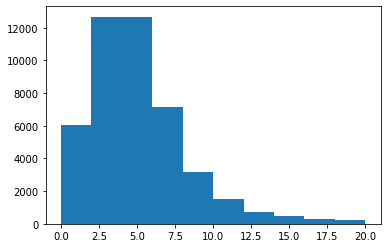

In [208]:
hist(values, range = [0,20])

(array([1965., 4071., 6196., 6437., 6731., 5941., 4099., 3061., 1991.,
        1200.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10.]),
 <a list of 10 Patch objects>)

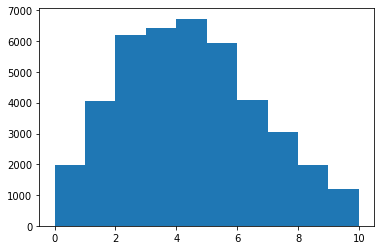

In [209]:
hist(values, range = [0,10])

In [221]:
speed = xr.DataArray(total_vel)

In [224]:
speed

<xarray.DataArray (dim_0: 1636)>
array([array([ 3.06424738,  2.07740062,  1.59393944,  3.06081659,  3.38414016,
        1.83540904,  1.83481066,  2.54024752,  2.27969907,  2.74859429,
        2.10864717,  1.13871804,  3.24034674,  2.84961494,  6.04381115,
        7.09746914,  5.33894803,  7.82386089,  8.10758979,  8.29071657,
       12.42897945, 13.1937775 , 11.72211545, 11.42202729, 14.7131438 ,
       25.04324867, 33.20787086, 19.88932014]),
       array([], dtype=float64),
       array([1.14370528, 9.38926741, 3.26485858, 3.4131182 , 4.68166438,
       4.81630938, 4.5412611 , 4.09141464, 3.85675495, 2.57728255,
       1.13303249, 1.6002364 , 3.26101311, 3.39241185, 3.06529828,
       2.25928101, 1.83645226, 3.23296419, 2.60955321, 3.11372074,
       2.74845021, 2.60921115, 5.70325005, 5.33607885, 6.45942644,
       7.5783377 , 8.87238473]),
       ...,
       array([1.024265  , 7.33663035, 4.30337421, 3.87063275, 6.3950385 ,
       5.41700434, 3.08405745, 5.23380566, 3.7556744 , 4.09646726,
       2.88004673, 3.25314872, 3.59491584, 5.14294986, 3.64971336,
       5.64028898, 7.05599616]),
       array([2.88987953, 2.62202242, 2.80605505, 4.90566659, 4.09241411,
       2.41423191, 3.0928939 , 2.70960489, 1.87948535, 2.81020588,
       3.19697203, 5.14561725, 4.21443193, 5.52745105, 5.26395266,
       8.47889391, 7.43515848, 6.86795768, 4.30211904, 0.93258135,
       2.61719879, 2.62042474, 2.1039043 ]),
       array([1.6150553 , 3.01919599, 1.57344478, 2.97614614, 1.61503202,
       2.53540947, 5.36680385])], dtype=object)
Dimensions without coordinates: dim_0

Discretización elegida:
* [<2],[2,4],[4,6],[6,8],[8,10],[10,12],[12,14],[>14]

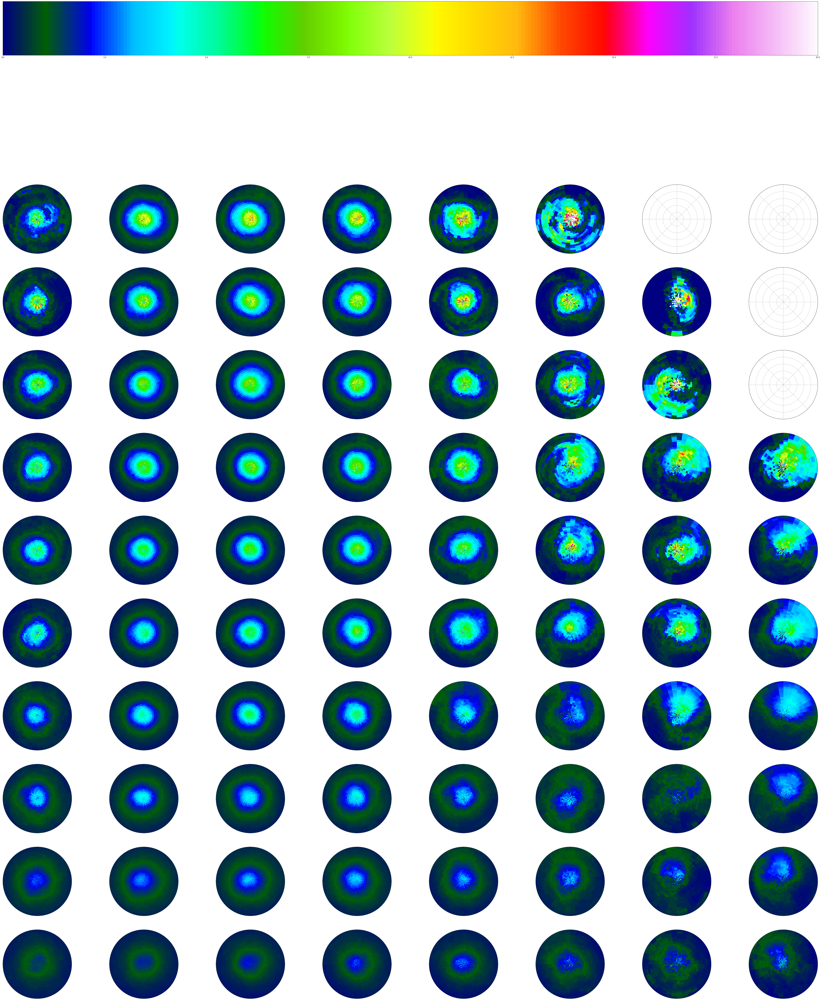

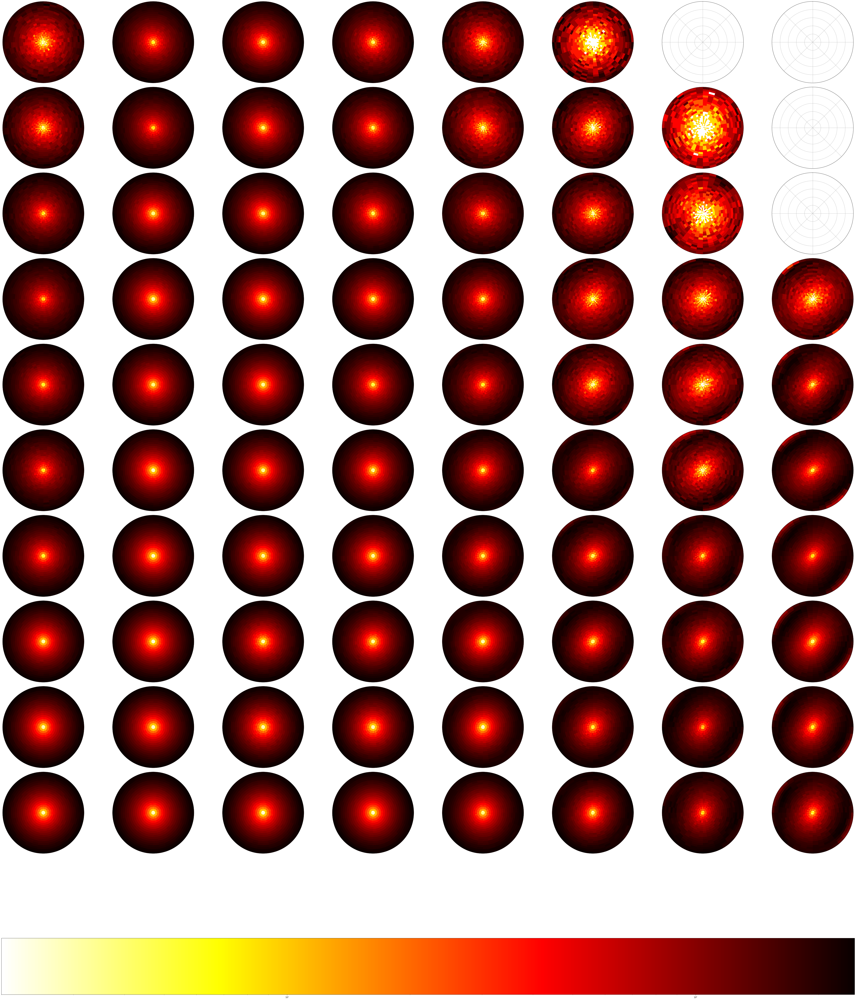

--- 6910.147659778595 seconds ---


In [6]:
start_time = time.time()

total_obs = []

#creación del mesh discretizado que quiero
th = np.array(range(0,370,10)) #discretización de ángulos
radius = np.array(range(0,525,25)) #discretización de radios
r, theta = np.meshgrid(radius,th) #mesh de r y theta

vel_discret = [[0,2],[2,4],[4,6],[6,8],[8,10],[10,12],[12,14],[14,100]]
pres_discret = [[0,920],[920,930],[930,940],[940,950],[950,960],[960,970],[970,980],[980,990],[990,1000],[1000,1200]]

#creamos fig,axs

fig, axes = plt.subplots(len(pres_discret), len(vel_discret), figsize=(80,80), subplot_kw=dict(polar=True))

fig2, axes2 = plt.subplots(len(pres_discret), len(vel_discret), figsize=(80,80), subplot_kw=dict(polar=True))

cells_obs = []

cells_data = []
for u in range(0,len(pres_discret)):
    for v in range(0,len(vel_discret)):
        
        total_obs = []
        total_idx = []
#comenzamos haciendo un bucle para cada storm
        for t in range(0,len(data.storm)):
            storm = xr.open_dataset('All_cyclones/ciclon_all'+str(t)+'.nc4') #seleccionamos la storm que corresponde en cada bucle
            storm_vel = xr.open_dataarray('All_cyclones/speed_ciclon_all'+str(t)+'.nc4')
            mask = np.where((pd.to_datetime(storm.time.values).strftime('%H') != '00') & (pd.to_datetime(storm.time.values).strftime('%H') !='03') &
                (pd.to_datetime(storm.time.values).strftime('%H') != '06') & (pd.to_datetime(storm.time.values).strftime('%H') !='09') &
                (pd.to_datetime(storm.time.values).strftime('%H') != '12') & (pd.to_datetime(storm.time.values).strftime('%H') !='15') &
                (pd.to_datetime(storm.time.values).strftime('%H') != '18') & (pd.to_datetime(storm.time.values).strftime('%H') !='21') )
    
    
    
            storm_pres = np.array(np.delete(storm.minPressure.values, np.append(np.where(np.abs(storm.latitude) > 49.875), mask), axis = 0)[:-1])
            storm_lat = np.array(np.delete(storm.latitude.values,np.append(np.where(np.abs(storm.latitude) > 49.875), mask) , axis = 0)[:-1])
            storm_lon = np.array(np.delete(storm.longitude.values,np.append(np.where(np.abs(storm.latitude) > 49.875), mask) , axis = 0)[:-1])
            storm_time = np.array(np.delete(storm.time.values,np.append(np.where(np.abs(storm.latitude) > 49.875), mask) , axis = 0)[:-1])
            storm_basin = np.array(np.delete(storm.basin.values,np.append(np.where(np.abs(storm.latitude)> 49.875), mask) , axis = 0)[:-1])
            storm_vel = np.array(np.delete(storm_vel.values,np.append(np.where(np.abs(storm.latitude)> 49.875), mask) , axis = 0)[:-1])
            storm_lat = np.abs(storm_lat)

    #seleccionamos datos con presiones entre 980-1000 mb y 5-10º latitud
            idx1 = np.where((storm_pres > pres_discret[u][0]) & (storm_pres <= pres_discret[u][1]))
    
            idx2 = np.where((storm_vel > vel_discret[v][0]) & (storm_vel <= vel_discret[v][1]))
    
            idx = np.intersect1d(idx1,idx2)
    
            if len(idx) > 1: #esto es un indicador de que existen observaciones para esa selección de presión y latitud
            
                storm_pres = storm_pres[idx]
                storm_lat = storm_lat[idx]
                storm_lon = storm_lon[idx]
                storm_time = storm_time[idx]
                storm_vel = storm_vel[idx]
            
                id1 = storm.id1[idx]
                id2 = storm.id2[idx]  
          
                for k in range(0,len(storm_time)): 
                    if k >= xr.open_dataarray('All_cyclones/dist_ciclon_all'+str(t)+'.nc4').shape[0]:
                        continue
    
                    obs = np.zeros((r.shape))
                    idx_list = np.zeros((r.shape))               
                
                    dist = xr.open_dataarray('All_cyclones/dist_ciclon_all'+str(t)+'.nc4').values[idx[k],:id1[k].values,:id2[k].values]
                    rad_ang = xr.open_dataarray('All_cyclones/ang_ciclon_all'+str(t)+'.nc4').values[idx[k],:id1[k].values,:id2[k].values]
                    prec = xr.open_dataarray('All_cyclones/precip_ciclon_all'+str(t)+'.nc4').values[idx[k],:id1[k].values,:id2[k].values]
                
                    if storm_basin[k] == 1 or storm_basin[k] == 4 or storm_basin[k] == 6 or storm_basin[k] == 9 or storm_basin[k]==10:
                        rad_ang = np.radians(360) - rad_ang

                    for i in range(obs.shape[0]):
                        for j in range(obs.shape[1]):
                            if j == 20 and i == 36 :
                                index = np.intersect1d(np.where((np.ravel(dist) <= 500) & (np.ravel(dist) >= radius[j])),
                               np.where(((np.ravel(rad_ang) >= np.radians(th[i])))))
                            elif j == 20:
                                index = np.intersect1d(np.where((np.ravel(dist) <= 500) & (np.ravel(dist) >= radius[j])),
                               np.where((np.ravel(rad_ang) <= np.radians(th[i+1])) & (np.ravel(rad_ang) >= np.radians(th[i]))))
                            elif i == 36:
                                index = np.intersect1d(np.where((np.ravel(dist) <= radius[j+1]) & (np.ravel(dist) >= radius[j])),
                               np.where(((np.ravel(rad_ang) >= np.radians(th[i])))))
                            else:
            
                                index = np.intersect1d(np.where((np.ravel(dist) <= radius[j+1]) & (np.ravel(dist) >= radius[j])),
                               np.where((np.ravel(rad_ang) <= np.radians(th[i+1])) & (np.ravel(rad_ang) >= np.radians(th[i]))))
                
                            idx_list[i,j] = len(index)
                            obs[i,j] = np.nanmean(np.ravel(prec)[index]) #cuando el index es un array vacío retorna nan, es decir no hay datos
            
                    total_obs.append(obs)
                    total_idx.append(idx_list)
            else:
                continue
    
        if len(total_obs) == 0:
        
            axes[u,v].set_theta_zero_location('N', offset=0)

            axes[u,v].set_theta_direction(-1)
    
            axes[u,v].set_yticklabels([])
    
            axes[u,v].set_xticklabels([])
        else:
        
            im = axes[u,v].pcolormesh(np.radians(theta),r, np.nanmean(np.array(total_obs), axis = 0), cmap='gist_ncar', vmin = 0, vmax = 20)

            axes[u,v].set_theta_zero_location('N', offset=0)

            axes[u,v].set_theta_direction(-1)
    
            axes[u,v].set_yticklabels([])
    
            axes[u,v].set_xticklabels([])

        total_obs = np.array(total_obs)
        
        cells_obs.append(total_obs)
        
        cells_data.append(np.array(total_idx))                        
        if len(total_obs) == 0:
        
            axes2[u,v].set_theta_zero_location('N', offset=0)

            axes2[u,v].set_theta_direction(-1)
    
            axes2[u,v].set_yticklabels([])
    
            axes2[u,v].set_xticklabels([])
        else:
        
            im2 = axes2[u,v].pcolormesh(np.radians(theta),r, np.nansum(np.array(total_idx), axis = 0),
                                        norm=matplotlib.colors.LogNorm(),cmap='hot_r')
            axes2[u,v].set_theta_zero_location('N', offset=0)

            axes2[u,v].set_theta_direction(-1)
    
            axes2[u,v].set_rgrids(np.arange(0, 500, 25), labels='')
    
            axes2[u,v].set_thetagrids(range(0, 360, 10), labels = '')
            
        
p0 = axes[0,0].get_position().get_points().flatten()
p2 = axes[0,v].get_position().get_points().flatten()
ax_cbar1 = fig.add_axes([p0[0], 1, p2[2]-p0[0], 0.05])

p3 = axes2[0,0].get_position().get_points().flatten()
p4 = axes2[0,v].get_position().get_points().flatten()
ax_cbar2 = fig2.add_axes([p3[0], 0, p4[2]-p3[0], 0.05])

plt.colorbar(im, cax=ax_cbar1, orientation='horizontal')
plt.colorbar(im2, cax=ax_cbar2, orientation='horizontal')

plt.subplots_adjust(wspace=0.05, hspace = 0.05)
plt.show()

print("--- %s seconds ---" % (time.time() - start_time))

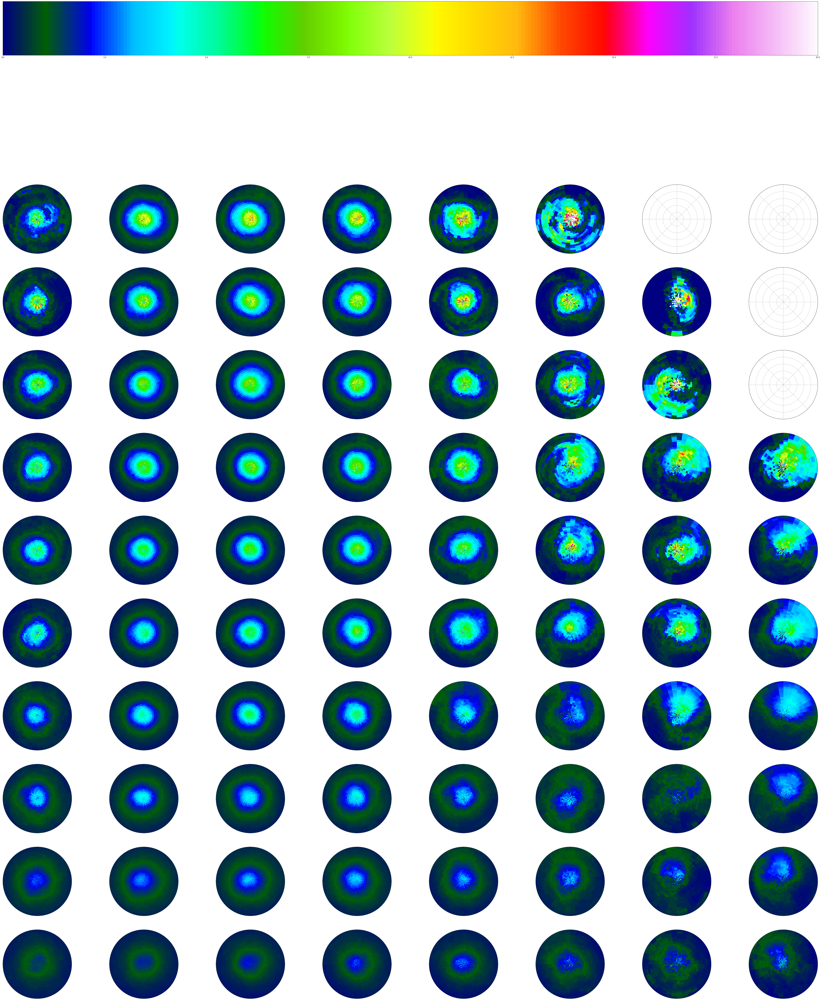

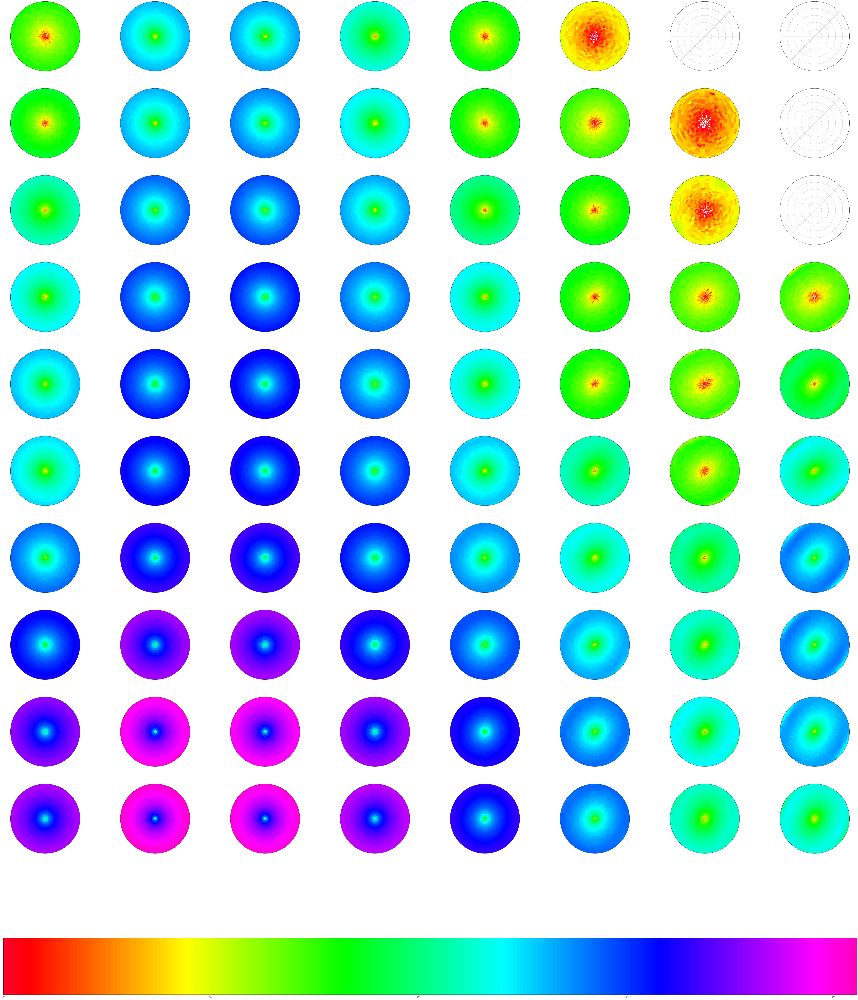

--- 92.52256894111633 seconds ---


In [15]:
start_time = time.time()

#creación del mesh discretizado que quiero
th = np.array(range(0,370,10)) #discretización de ángulos
radius = np.array(range(0,525,25)) #discretización de radios
r, theta = np.meshgrid(radius,th) 

fig, axes = plt.subplots(10, 8, figsize=(80,80), subplot_kw=dict(polar=True))
fig2, axes2 = plt.subplots(10, 8, figsize=(80,80), subplot_kw=dict(polar=True))

i = -1
for u in range(0,10):
    for v in range(0,8):
        i = i + 1
        
        if len(xr.open_dataarray('DataPmin_Vel/pmin_vel_obs'+str(i)+'.nc4')) == 0:
        
            axes[u,v].set_theta_zero_location('N', offset=0)

            axes[u,v].set_theta_direction(-1)
    
            axes[u,v].set_yticklabels([])
    
            axes[u,v].set_xticklabels([])
        else:
        
            im = axes[u,v].pcolormesh(np.radians(theta),r,np.nanmean(xr.open_dataarray('DataPmin_Vel/pmin_vel_obs'+str(i)+'.nc4') , axis = 0),
                                      cmap='gist_ncar', vmin = 0, vmax = 20)

            axes[u,v].set_theta_zero_location('N', offset=0)

            axes[u,v].set_theta_direction(-1)
    
            axes[u,v].set_yticklabels([])
    
            axes[u,v].set_xticklabels([])
        
     
        if len(xr.open_dataarray('DataPmin_Vel/pmin_vel_obs'+str(i)+'.nc4')) == 0:
        
            axes2[u,v].set_theta_zero_location('N', offset=0)

            axes2[u,v].set_theta_direction(-1)
    
            axes2[u,v].set_yticklabels([])
    
            axes2[u,v].set_xticklabels([])
        else:
        
            im2 = axes2[u,v].pcolormesh(np.radians(theta),r, np.nansum(xr.open_dataarray('DataPmin_Vel/pmin_vel_idx'+str(i)+'.nc4') , axis = 0),
                                    norm = matplotlib.colors.LogNorm(),cmap='gist_rainbow',vmin = 1, vmax = 12940)

            axes2[u,v].set_theta_zero_location('N', offset=0)

            axes2[u,v].set_theta_direction(-1)
    
            axes2[u,v].set_rgrids(np.arange(0, 500, 25), labels='')
    
            axes2[u,v].set_thetagrids(range(0, 360, 10), labels = '')
            
        
        
p0 = axes[0,0].get_position().get_points().flatten()
p2 = axes[0,v].get_position().get_points().flatten()
ax_cbar1 = fig.add_axes([p0[0], 1, p2[2]-p0[0], 0.05])

p3 = axes2[0,0].get_position().get_points().flatten()
p4 = axes2[0,v].get_position().get_points().flatten()
ax_cbar2 = fig2.add_axes([p3[0], 0, p4[2]-p3[0], 0.05])

fig.colorbar(im, cax=ax_cbar1, orientation='horizontal')
fig.colorbar(im2, cax=ax_cbar2, orientation='horizontal')

plt.subplots_adjust(wspace=0.05, hspace = 0.25)
plt.show()

print("--- %s seconds ---" % (time.time() - start_time))